Dataco is an Ecommerce platform selling sporting goods and accessories across the world. 
E-commerce goods Late delivery risk identification by predicting fastest and normal Shipping Durations. The machine learning  models built by us, will enable E-commerce and Goods/products delivery industries to identify the 'risk of late delivery' and predict the fastest and normal duration of goods shipment for their Inland and foreign clients/ customers/buyers.

This is the dataset of Supply Chains used by the company DataaCo Global which includes a collection of their products sold, finacial details(profit, loss, total sales etc.), Shipping details, and customer details such as sales, demographics, and transaction details. The data spans to 91 MB engulfing details of 180,520 customers spanning to 53 columns related to Clothing , Sports,and Electronic Supplies.

It represents the sale of sporting goods across the world in different regions such as Africa, Europe, LATAM, US and Asia. 
The data represents the time period for 4years ie, 2015 to 2018.

### Business Objective

Build a regression model to predict sales.

Build a binary classification model to classify orders with high probability of late delivery.

### Data Dictionary: Fields	Description

Type	:  Type of transaction made

Days for shipping (real)     	:  Actual shipping days of the purchased product

Days for shipment (scheduled)	:  Days of scheduled delivery of the purchased product

Benefit per order	:  Earnings per order placed

Sales per customer	:  Total sales per order made per customer

Delivery Status	:  Delivery status of orders: Advance shipping , Late delivery , Shipping canceled , Shipping on time

Late_delivery_risk           	:  Categorical variable that indicates if sending is late           (1), it is not late (0).

Category Id	:  Product category code

Category Name	:  Description of the product category

Customer City	:  City where the customer made the purchase

Customer Country	:  Country where the customer made the purchase

Customer Email	:  Customer's email

Customer Fname	:  Customer name

Customer Id	:  Customer ID

Customer Lname	:  Customer lastname

Customer Password	:  Masked customer key

Customer Segment	:  Types of Customers: Consumer , Corporate , Home Office

Customer State	:  State to which the store where the purchase is registered belongs

Customer Street	:  Street to which the store where the purchase is registered belongs

Customer Zipcode	:  Customer Zipcode

Department Id	:  Department code of store

Department Name	:  Department name of store

Latitude	:  Latitude corresponding to location of store

Longitude	:  Longitude corresponding to location of store

Market	:  Market to where the order is delivered : Africa , Europe , LATAM , Pacific Asia , USCA

Order City	:  Destination city of the order

Order Country	:  Destination country of the order

Order Customer Id	:  Customer order code

order date (DateOrders)	:  Date on which the order is made

Order Id	:  Order code

Order Item Cardprod Id	:  Product code generated through the RFID reader

Order Item Discount	:  Order item discount value

Order Item Discount Rate     	:  Order item discount percentage

Order Item Id	:  Order item code

Order Item Product Price     	:  Price of products without discount

Order Item Profit Ratio	:  Order Item Profit Ratio

Order Item Quantity	:  Number of products per order

Sales	:  Value in sales

Order Item Total  	:  Total amount per order

Order Profit Per Order	:  Order Profit Per Order

Order Region	:  Region of the world where the order is delivered :  Southeast Asia ,South Asia ,Oceania ,Eastern Asia, West Asia , West of USA , US Center , West Africa, Central Africa ,North Africa ,Western Europe ,Northern , Caribbean , South America ,East Africa ,Southern Europe , East of USA ,Canada ,Southern Africa , Central Asia ,  Europe , Central America, Eastern Europe , South of  USA 

Order State	:  State of the region where the order is delivered

Order Status	:  Order Status : COMPLETE , PENDING , CLOSED , PENDING_PAYMENT ,CANCELED , PROCESSING ,SUSPECTED_FRAUD ,ON_HOLD ,PAYMENT_REVIEW

Product Card Id	:  Product code

Product Category Id	:  Product category code

Product Description	:  Product Description

Product Image	:  Link of visit and purchase of the product

Product Name	:  Product Name

Product Price	:  Product Price

Product Status	:  Status of the product stock :If it is 1 not available , 0 the product is available 

Shipping date (DateOrders)   	:  Exact date and time of shipment

Shipping Mode	:  The following shipping modes are presented : Standard Class , First Class , Second Class , Same Day

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
import numpy as np
from sklearn.model_selection import train_test_split
from statsmodels.api import OLS,add_constant
from sklearn.metrics import r2_score,classification_report
from statsmodels.tools.eval_measures import rmse
from sklearn.linear_model import LogisticRegression
from lime import lime_tabular
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns=None

## Reading the Data

In [2]:
df=pd.read_csv('DataCoSupplyChainDataset.csv',encoding='unicode_escape')
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,Customer Country,Customer Email,Customer Fname,Customer Id,Customer Lname,Customer Password,Customer Segment,Customer State,Customer Street,Customer Zipcode,Department Id,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Customer Id,order date (DateOrders),Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Cally,20755,Holloway,XXXXXXXXX,Consumer,PR,5365 Noble Nectar Island,725.0,2,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,20755,1/31/2018 22:56,77202,1360,13.110000,0.04,180517,327.75,0.29,1,327.75,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Irene,19492,Luna,XXXXXXXXX,Consumer,PR,2679 Rustic Loop,725.0,2,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,19492,1/13/2018 12:27,75939,1360,16.389999,0.05,179254,327.75,-0.80,1,327.75,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,EE. UU.,XXXXXXXXX,Gillian,19491,Maldonado,XXXXXXXXX,Consumer,CA,8510 Round Bear Gate,95125.0,2,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,19491,1/13/2018 12:06,75938,1360,18.030001,0.06,179253,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,EE. UU.,XXXXXXXXX,Tana,19490,Tate,XXXXXXXXX,Home Office,CA,3200 Amber Bend,90027.0,2,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,19490,1/13/2018 11:45,75937,1360,22.940001,0.07,179252,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,Puerto Rico,XXXXXXXXX,Orli,19489,Hendricks,XXXXXXXXX,Corporate,PR,8671 Iron Anchor Corners,725.0,2,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,19489,1/13/2018 11:24,75936,1360,29.500000,0.09,179251,327.75,0.45,1,327.75,298.250000,134.210007,Oceania,Queensland,PENDING_PAYMENT,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


## Basic Data Information

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-null  object 
 12  Customer Fname                

## Checking Duplicates

In [31]:
df.duplicated().sum()

0

## Dropping Unnecessary Columns

In [3]:
del_cols= ['Category Id','Customer Email','Customer Fname','Customer Id','Customer Lname',
           'Customer Password','Customer Street','Department Id','Order Customer Id','Order Id',
           'Order Item Cardprod Id','Product Card Id','Order Item Id','Product Card Id',
           'Product Category Id', 'Product Description', 'Product Image']
df=df.drop(del_cols,axis=1)
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Item Discount,Order Item Discount Rate,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Order Region,Order State,Order Status,Order Zipcode,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,1/31/2018 22:56,13.110000,0.04,327.75,0.29,1,327.75,314.640015,91.250000,Southeast Asia,Java Occidental,COMPLETE,NaN,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,1/13/2018 12:27,16.389999,0.05,327.75,-0.80,1,327.75,311.359985,-249.089996,South Asia,Rajastán,PENDING,NaN,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,18.030001,0.06,327.75,-0.80,1,327.75,309.720001,-247.779999,South Asia,Rajastán,CLOSED,NaN,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,22.940001,0.07,327.75,0.08,1,327.75,304.809998,22.860001,Oceania,Queensland,COMPLETE,NaN,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Corporate,PR,725.0,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,1/13/2018 11:24,29.500000,0.09,327.75,0.45,1,327.75,298.250000,134.210007,Oceania,Queensland,PENDING_PAYMENT,NaN,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [33]:
df.shape

(180519, 37)

## Descriptive Statistics

In [34]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Days for shipping (real),180519.0,3.497654,1.623722,0.000000,2.000000,3.000000,5.000000,6.000000
Days for shipment (scheduled),180519.0,2.931847,1.374449,0.000000,2.000000,4.000000,4.000000,4.000000
Benefit per order,180519.0,21.974989,104.433526,-4274.979980,7.000000,31.520000,64.800003,911.799988
Sales per customer,180519.0,183.107609,120.043670,7.490000,104.379997,163.990005,247.399994,1939.989990
Late_delivery_risk,180519.0,0.548291,0.497664,0.000000,0.000000,1.000000,1.000000,1.000000
Customer Zipcode,180516.0,35921.126914,37542.461122,603.000000,725.000000,19380.000000,78207.000000,99205.000000
Latitude,180519.0,29.719955,9.813646,-33.937553,18.265432,33.144863,39.279617,48.781933
Longitude,180519.0,-84.915675,21.433241,-158.025986,-98.446312,-76.847908,-66.370583,115.263077
Order Item Discount,180519.0,20.664741,21.800901,0.000000,5.400000,14.000000,29.990000,500.000000
Order Item Discount Rate,180519.0,0.101668,0.070415,0.000000,0.040000,0.100000,0.160000,0.250000


In [4]:
df=df.drop(['Product Status','Order Profit Per Order','Order Item Product Price','Order Item Total'],
           axis=1)
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,order date (DateOrders),Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Sales,Order Region,Order State,Order Status,Order Zipcode,Product Name,Product Price,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,1/31/2018 22:56,13.110000,0.04,0.29,1,327.75,Southeast Asia,Java Occidental,COMPLETE,NaN,Smart watch,327.75,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,1/13/2018 12:27,16.389999,0.05,-0.80,1,327.75,South Asia,Rajastán,PENDING,NaN,Smart watch,327.75,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,1/13/2018 12:06,18.030001,0.06,-0.80,1,327.75,South Asia,Rajastán,CLOSED,NaN,Smart watch,327.75,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,1/13/2018 11:45,22.940001,0.07,0.08,1,327.75,Oceania,Queensland,COMPLETE,NaN,Smart watch,327.75,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Corporate,PR,725.0,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,1/13/2018 11:24,29.500000,0.09,0.45,1,327.75,Oceania,Queensland,PENDING_PAYMENT,NaN,Smart watch,327.75,1/15/2018 11:24,Standard Class


In [36]:
df.shape

(180519, 33)

In [37]:
df.describe(include=object).T

,count,unique,top,freq
Type,180519,4,DEBIT,69295
Delivery Status,180519,4,Late delivery,98977
Category Name,180519,50,Cleats,24551
Customer City,180519,563,Caguas,66770
Customer Country,180519,2,EE. UU.,111146
Customer Segment,180519,3,Consumer,93504
Customer State,180519,46,PR,69373
Department Name,180519,11,Fan Shop,66861
Market,180519,5,LATAM,51594
Order City,180519,3597,Santo Domingo,2211


**Insights:**

1. Most selling product: Perfect Fitness Perfect Rip Deck
2. Customer segment with highest business: Consumer	
3. Market with highest business: LATAM	
4. Product category with highest business: Cleats
5. Debit transactions are the most frequent.
6. Majority of the orders have late delivery.
7. City with highest business: Caguas
8. Country with highest business: USA

In [5]:
df['order date (DateOrders)']=pd.to_datetime(df['order date (DateOrders)'])
df['shipping date (DateOrders)']=pd.to_datetime(df['shipping date (DateOrders)'])
df[['shipping date (DateOrders)','order date (DateOrders)']].dtypes

shipping date (DateOrders)    datetime64[ns]
order date (DateOrders)       datetime64[ns]
dtype: object

In [6]:
df['order year']= df['order date (DateOrders)'].dt.year
df['order month']=df['order date (DateOrders)'].dt.month
df['order day']=df['order date (DateOrders)'].dt.day
df['order weekday']=df['order date (DateOrders)'].dt.weekday
df['shipping year']= df['shipping date (DateOrders)'].dt.year
df['shipping month']=df['shipping date (DateOrders)'].dt.month
df['shipping day']=df['shipping date (DateOrders)'].dt.day
df['shipping weekday']=df['shipping date (DateOrders)'].dt.weekday
df=df.drop(['order date (DateOrders)','shipping date (DateOrders)'],axis=1)
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Customer Zipcode,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Sales,Order Region,Order State,Order Status,Order Zipcode,Product Name,Product Price,Shipping Mode,order year,order month,order day,order weekday,shipping year,shipping month,shipping day,shipping weekday
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,725.0,Fitness,18.251453,-66.037056,Pacific Asia,Bekasi,Indonesia,13.110000,0.04,0.29,1,327.75,Southeast Asia,Java Occidental,COMPLETE,NaN,Smart watch,327.75,Standard Class,2018,1,31,2,2018,2,3,5
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,725.0,Fitness,18.279451,-66.037064,Pacific Asia,Bikaner,India,16.389999,0.05,-0.80,1,327.75,South Asia,Rajastán,PENDING,NaN,Smart watch,327.75,Standard Class,2018,1,13,5,2018,1,18,3
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,Sporting Goods,San Jose,EE. UU.,Consumer,CA,95125.0,Fitness,37.292233,-121.881279,Pacific Asia,Bikaner,India,18.030001,0.06,-0.80,1,327.75,South Asia,Rajastán,CLOSED,NaN,Smart watch,327.75,Standard Class,2018,1,13,5,2018,1,17,2
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,Sporting Goods,Los Angeles,EE. UU.,Home Office,CA,90027.0,Fitness,34.125946,-118.291016,Pacific Asia,Townsville,Australia,22.940001,0.07,0.08,1,327.75,Oceania,Queensland,COMPLETE,NaN,Smart watch,327.75,Standard Class,2018,1,13,5,2018,1,16,1
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Corporate,PR,725.0,Fitness,18.253769,-66.037048,Pacific Asia,Townsville,Australia,29.500000,0.09,0.45,1,327.75,Oceania,Queensland,PENDING_PAYMENT,NaN,Smart watch,327.75,Standard Class,2018,1,13,5,2018,1,15,0


In [8]:
df.shape

(180519, 39)

## Missing Values Analysis

In [50]:
df.isna().mean()*100

Type                              0.000000
Days for shipping (real)          0.000000
Days for shipment (scheduled)     0.000000
Benefit per order                 0.000000
Sales per customer                0.000000
Delivery Status                   0.000000
Late_delivery_risk                0.000000
Category Name                     0.000000
Customer City                     0.000000
Customer Country                  0.000000
Customer Segment                  0.000000
Customer State                    0.000000
Customer Zipcode                  0.001662
Department Name                   0.000000
Latitude                          0.000000
Longitude                         0.000000
Market                            0.000000
Order City                        0.000000
Order Country                     0.000000
Order Item Discount               0.000000
Order Item Discount Rate          0.000000
Order Item Profit Ratio           0.000000
Order Item Quantity               0.000000
Sales      

In [7]:
df=df.drop(['Customer Zipcode','Order Zipcode'],axis=1)
df.isna().sum()

Type                             0
Days for shipping (real)         0
Days for shipment (scheduled)    0
Benefit per order                0
Sales per customer               0
Delivery Status                  0
Late_delivery_risk               0
Category Name                    0
Customer City                    0
Customer Country                 0
Customer Segment                 0
Customer State                   0
Department Name                  0
Latitude                         0
Longitude                        0
Market                           0
Order City                       0
Order Country                    0
Order Item Discount              0
Order Item Discount Rate         0
Order Item Profit Ratio          0
Order Item Quantity              0
Sales                            0
Order Region                     0
Order State                      0
Order Status                     0
Product Name                     0
Product Price                    0
Shipping Mode       

## Univariate Analysis

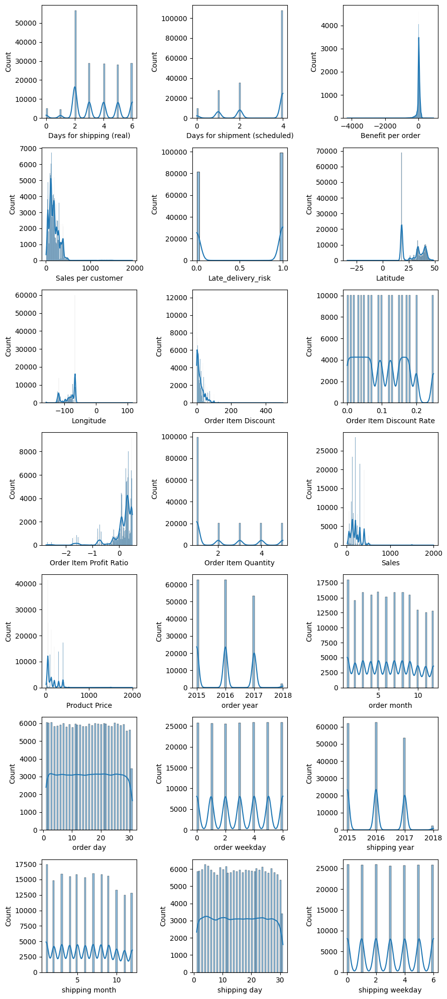

In [56]:
n=1
plt.figure(figsize=(9,20))
for i in df.select_dtypes('number'):
    plt.subplot(7,3,n)
    sns.histplot(x=df[i],kde=True)
    n+=1
plt.tight_layout()
plt.show()

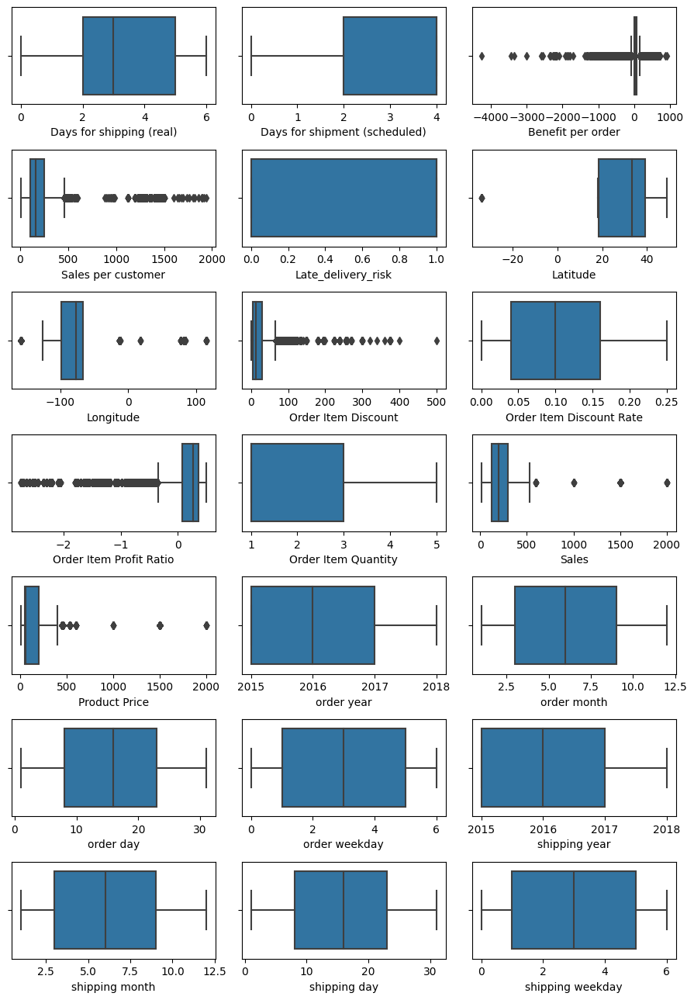

In [59]:
n=1
plt.figure(figsize=(9,13))
for i in df.select_dtypes('number'):
    plt.subplot(7,3,n)
    sns.boxplot(x=df[i])
    n+=1
plt.tight_layout()
plt.show()

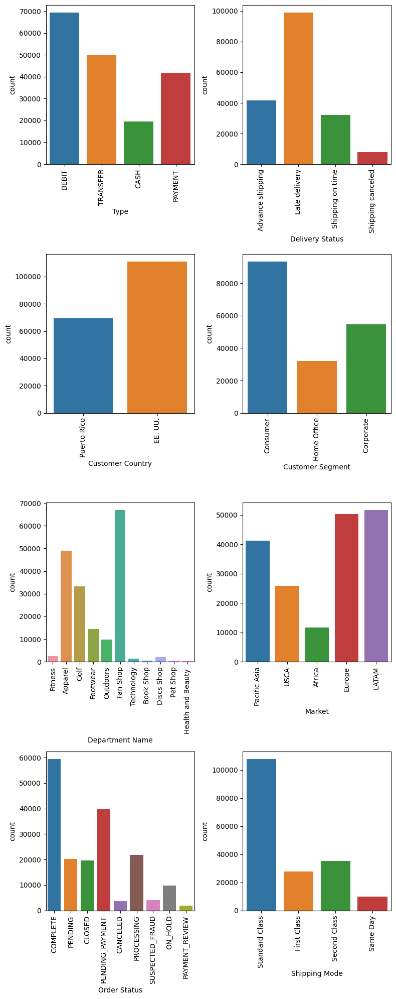

In [77]:
u=df.select_dtypes(object).nunique()
n=1
plt.figure(figsize=(8,20))
for i in u[u<23].index:
    plt.subplot(4,2,n)
    sns.countplot(x=df[i])
    plt.xticks(rotation=90)
    n+=1
plt.tight_layout()
plt.show()

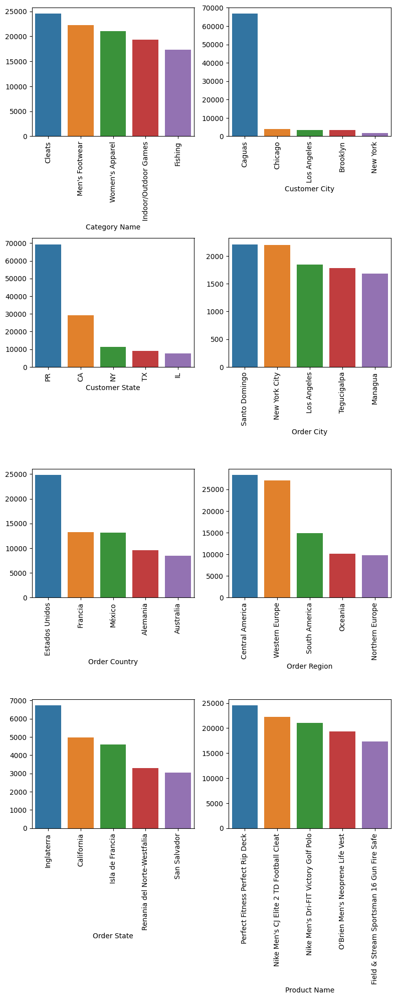

In [86]:
n=1
plt.figure(figsize=(8,20))
for i in u[u>=23].index:
    plt.subplot(4,2,n)
    v=df[i].value_counts()[:5]
    sns.barplot(x=v.index,y=v.values)
    plt.xticks(rotation=90)
    plt.xlabel(i)
    n+=1
plt.tight_layout()
plt.show()

In [83]:
for i in df:
    print(i)
    print(df[i].value_counts(),end='\n\n')

Type
DEBIT       69295
TRANSFER    49883
PAYMENT     41725
CASH        19616
Name: Type, dtype: int64

Days for shipping (real)
2    56618
3    28765
6    28723
4    28513
5    28163
0     5080
1     4657
Name: Days for shipping (real), dtype: int64

Days for shipment (scheduled)
4    107752
2     35216
1     27814
0      9737
Name: Days for shipment (scheduled), dtype: int64

Benefit per order
 0.000000      1177
 143.990005     199
 72.000000      194
 46.799999      188
 24.000000      181
               ... 
-48.830002        1
 48.220001        1
-145.729996       1
-330.109985       1
-337.100006       1
Name: Benefit per order, Length: 21998, dtype: int64

Sales per customer
122.839996    1264
109.190002    1247
124.790001    1243
129.990005    1243
116.989998    1243
              ... 
455.950012       1
470.250000       1
424.790008       1
98.010002        1
474.760010       1
Name: Sales per customer, Length: 2927, dtype: int64

Delivery Status
Late delivery        98977
Adv

2016    62602
2015    62002
2017    53546
2018     2369
Name: shipping year, dtype: int64

shipping month
1     17404
7     15954
3     15886
5     15843
8     15789
9     15539
4     15451
6     15282
2     14831
10    13293
12    12771
11    12476
Name: shipping month, dtype: int64

shipping day
4     6260
5     6173
11    6161
24    6127
9     6095
27    6030
22    6023
3     5969
10    5964
6     5959
16    5956
23    5941
18    5941
14    5924
19    5905
2     5893
20    5879
25    5872
1     5867
21    5865
15    5853
28    5811
7     5805
13    5802
17    5802
26    5769
12    5765
29    5694
8     5645
30    5359
31    3410
Name: shipping day, dtype: int64

shipping weekday
0    25923
2    25901
6    25846
1    25813
5    25808
4    25670
3    25558
Name: shipping weekday, dtype: int64



## Bivariate Analysis

In [9]:
df.corr()

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Late_delivery_risk,Latitude,Longitude,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Sales,Product Price,order year,order month,order day,order weekday,shipping year,shipping month,shipping day,shipping weekday
Days for shipping (real),1.000000,0.515880,-0.005101,0.001757,0.401415,-0.004073,0.003911,0.002231,0.001467,-0.004638,-0.000811,0.001962,0.002185,0.000842,-0.007593,-0.000476,-0.002870,0.005414,-0.005040,-0.004153,0.002502
Days for shipment (scheduled),0.515880,1.000000,-0.000185,0.006445,-0.369352,-0.005300,0.003675,0.002897,0.000065,-0.001822,-0.002925,0.006327,0.006912,0.000656,-0.007458,-0.000849,-0.004602,0.003176,-0.006171,-0.008115,0.003089
Benefit per order,-0.005101,-0.000185,1.000000,0.133484,-0.003727,0.000338,-0.002521,0.064756,-0.018644,0.823689,0.015696,0.131816,0.103459,0.010703,0.009064,0.003491,0.000228,0.010567,0.009361,0.002701,0.003789
Sales per customer,0.001757,0.006445,0.133484,1.000000,-0.003791,-0.000223,0.001444,0.498734,-0.119469,-0.001439,0.105413,0.989744,0.781781,0.059581,0.056917,0.035593,0.007687,0.060635,0.055813,0.006611,-0.002860
Late_delivery_risk,0.401415,-0.369352,-0.003727,-0.003791,1.000000,0.000679,-0.001915,-0.000750,0.000404,-0.002316,-0.000139,-0.003564,-0.002175,-0.002181,0.002587,-0.002028,0.001121,-0.000448,0.003688,-0.000386,0.000733
Latitude,-0.004073,-0.005300,0.000338,-0.000223,0.000679,1.000000,-0.525122,-0.002997,-0.003889,-0.000081,-0.001853,-0.000696,0.000471,-0.001759,-0.004335,0.006954,-0.007933,-0.001496,-0.004447,-0.001672,0.003789
Longitude,0.003911,0.003675,-0.002521,0.001444,-0.001915,-0.525122,1.000000,0.002343,0.000526,-0.003582,0.004467,0.001696,-0.000894,0.001800,0.002976,-0.007870,0.003096,0.001468,0.003482,-0.001754,-0.010819
Order Item Discount,0.002231,0.002897,0.064756,0.498734,-0.000750,-0.002997,0.002343,1.000000,0.659955,-0.002788,0.065379,0.617438,0.488101,0.037148,0.035674,0.024528,0.003550,0.037898,0.034991,0.003451,-0.000029
Order Item Discount Rate,0.001467,0.000065,-0.018644,-0.119469,0.000404,-0.003889,0.000526,0.659955,1.000000,-0.002691,-0.000028,0.000346,0.000345,0.000078,0.001107,0.001248,0.002027,0.000149,0.001026,0.000028,0.002245
Order Item Profit Ratio,-0.004638,-0.001822,0.823689,-0.001439,-0.002316,-0.000081,-0.003582,-0.002788,-0.002691,1.000000,0.001128,-0.001766,-0.002043,0.002184,0.001927,-0.001671,-0.002280,0.002105,0.001959,-0.000420,0.004859


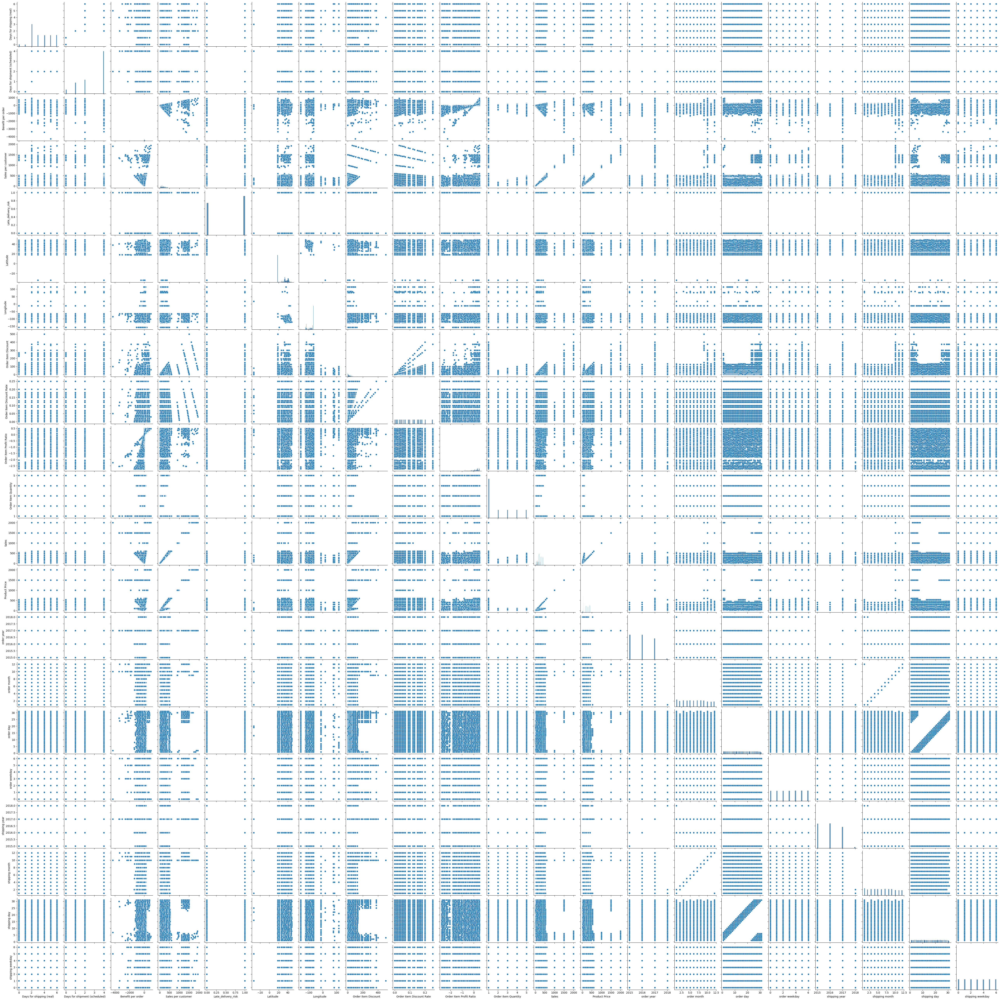

In [10]:
sns.pairplot(df)
plt.show()

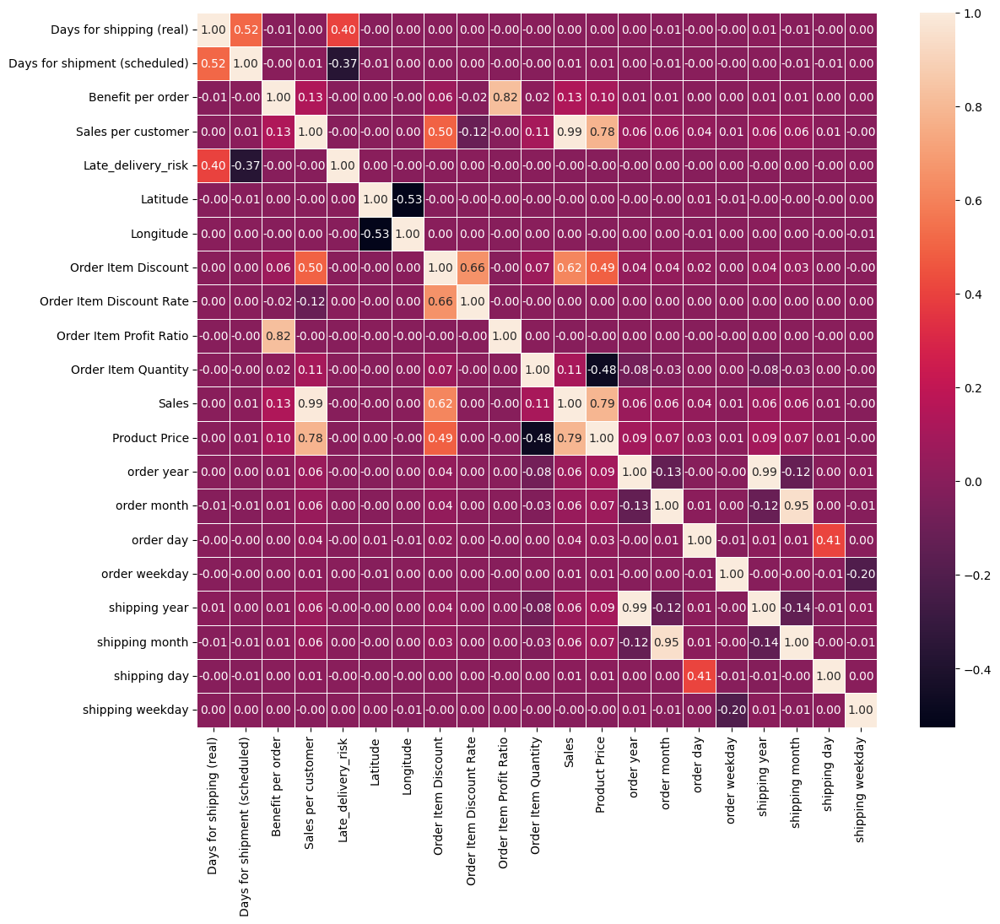

In [18]:
plt.figure(figsize=(13,11))
sns.heatmap(df.corr(),annot=True,fmt='.2f',linewidths=.5)
plt.show()

### Hypothesis Testing

H0: 'Sales' and 'Sales per customer' are not correlated.

H1: 'Sales' and 'Sales per customer' are correlated.

Significance level = 0.05

In [20]:
print('P-value =',stats.pearsonr(df.Sales,df['Sales per customer'])[1])

P-value = 0.0


Since the p-value is much less than the significance level, we reject the null hypothesis. Hence, there is enough evidence to conclude that 'Sales' and 'Sales per customer' are correlated.

In [21]:
df.groupby('Type').Sales.describe()

,count,mean,std,min,25%,50%,75%,max
Type,,,,,,,,
CASH,19616.0,205.068524,134.193693,9.99,119.980003,199.919998,299.950012,1999.98999
DEBIT,69295.0,203.143916,133.843804,9.99,119.980003,199.919998,299.950012,1999.98999
PAYMENT,41725.0,203.483552,129.941285,9.99,119.980003,199.919998,299.950012,1500.00000
TRANSFER,49883.0,204.376280,131.244421,9.99,119.980003,199.919998,299.950012,1999.98999


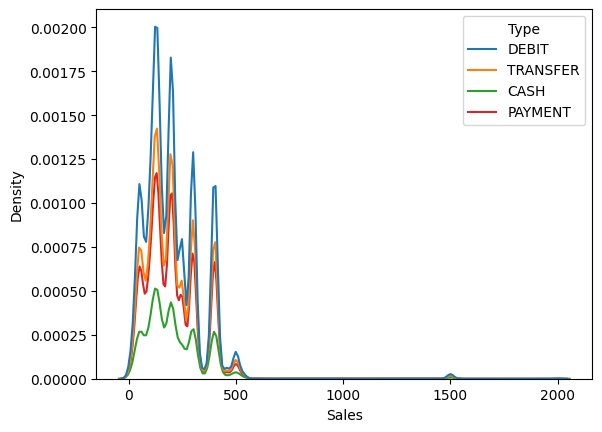

In [28]:
sns.kdeplot(x=df.Sales,hue=df.Type)
plt.show()

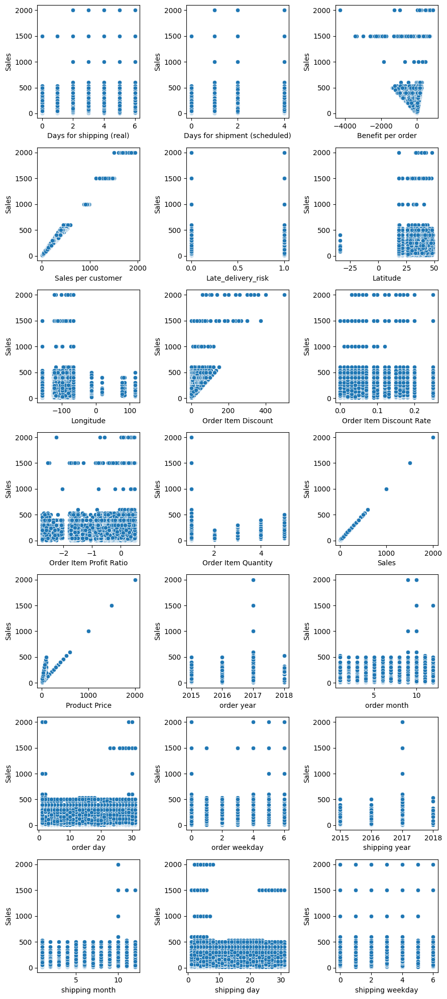

In [20]:
n=1
plt.figure(figsize=(9,20))
for i in df.select_dtypes('number'):
    plt.subplot(7,3,n)
    sns.scatterplot(x=df[i],y=df.Sales)
    n+=1
plt.tight_layout()
plt.show()

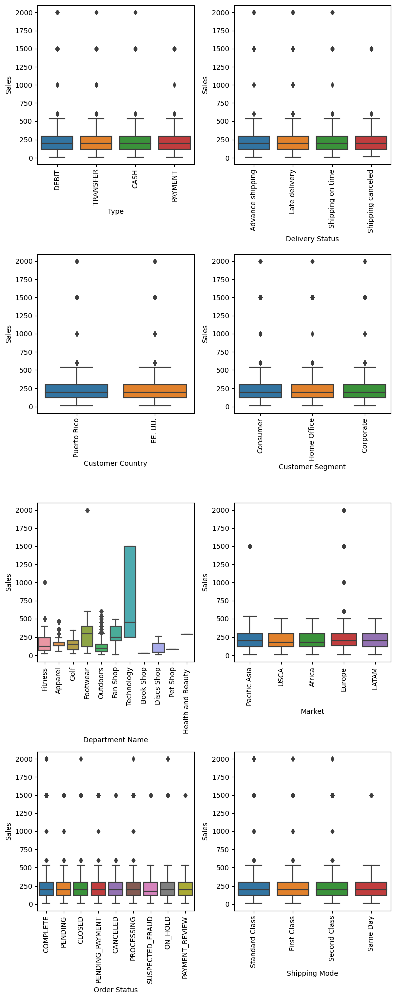

In [21]:
u=df.select_dtypes(object).nunique()
n=1
plt.figure(figsize=(8,20))
for i in u[u<23].index:
    plt.subplot(4,2,n)
    sns.boxplot(x=df[i],y=df.Sales)
    plt.xticks(rotation=90)
    n+=1
plt.tight_layout()
plt.show()

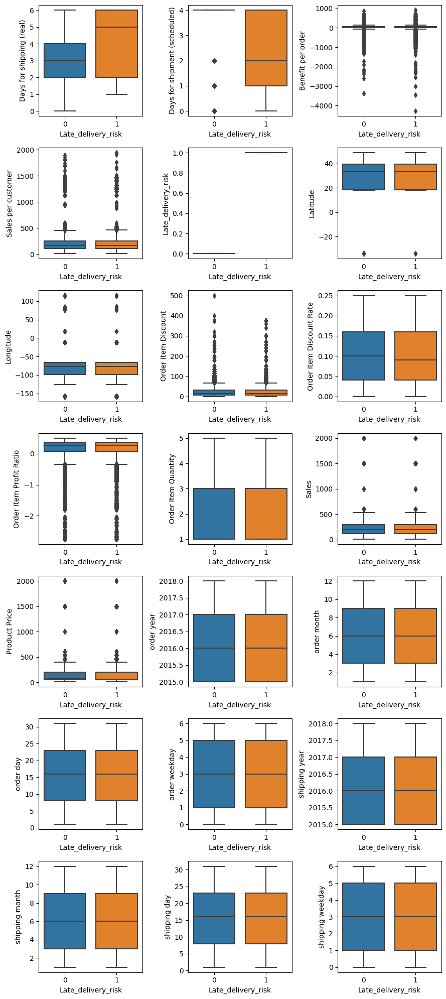

In [24]:
n=1
plt.figure(figsize=(9,20))
for i in df.select_dtypes('number'):
    plt.subplot(7,3,n)
    sns.boxplot(x=df.Late_delivery_risk,y=df[i])
    n+=1
plt.tight_layout()
plt.show()

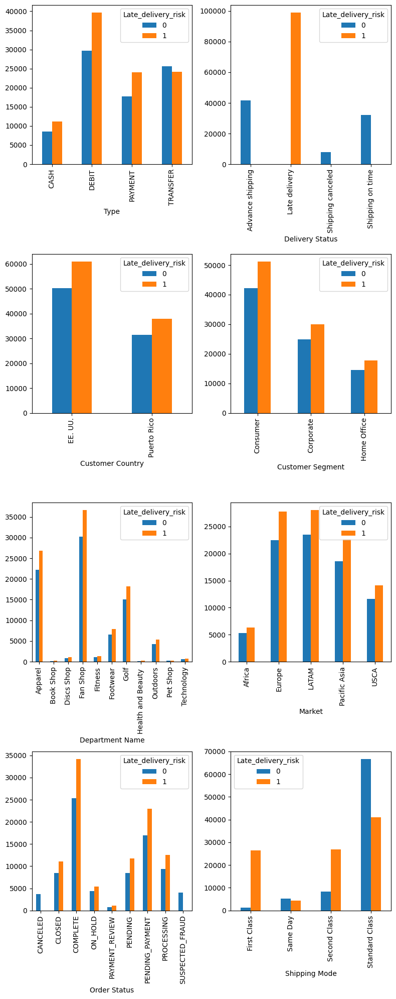

In [25]:
u=df.select_dtypes(object).nunique()
n=1
plt.figure(figsize=(8,20))
for i in u[u<23].index:
    ax=plt.subplot(4,2,n)
    pd.crosstab(df[i],df.Late_delivery_risk).plot.bar(ax=ax)
    plt.xticks(rotation=90)
    n+=1
plt.tight_layout()
plt.show()

## Multivariate Analysis

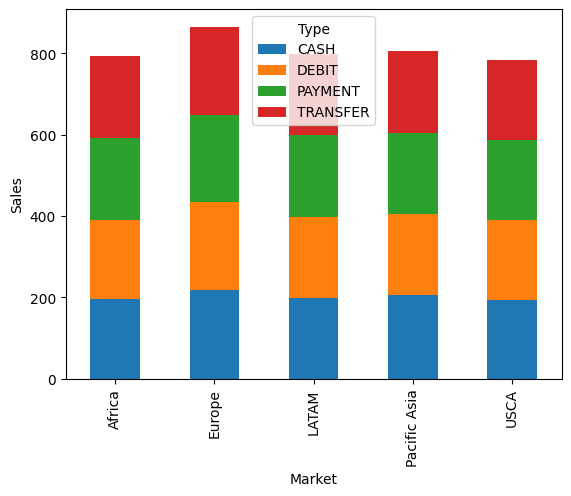

In [26]:
df.pivot_table('Sales','Market','Type').plot.bar(stacked=True)
plt.ylabel('Sales')
plt.show()

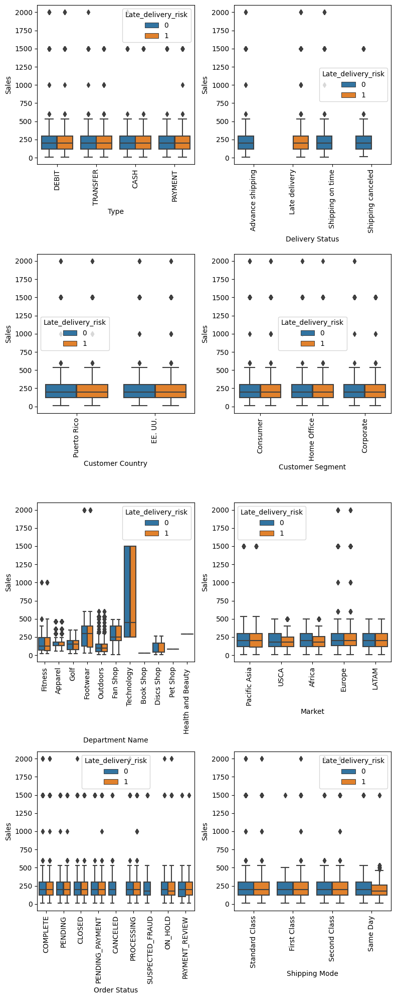

In [24]:
u=df.select_dtypes(object).nunique()
n=1
plt.figure(figsize=(8,20))
for i in u[u<23].index:
    plt.subplot(4,2,n)
    sns.boxplot(x=df[i],y=df.Sales,hue=df.Late_delivery_risk)
    plt.xticks(rotation=90)
    n+=1
plt.tight_layout()
plt.show()

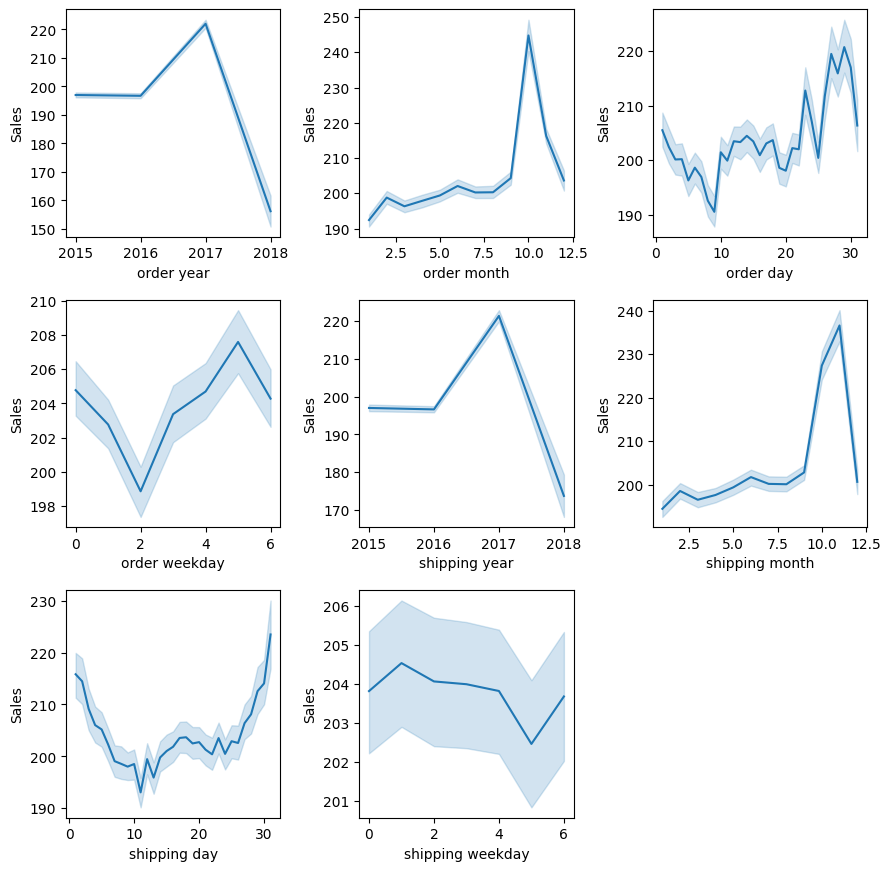

In [35]:
n=1
plt.figure(figsize=(9,20))
for i in df.loc[:,'order year':]:
    plt.subplot(7,3,n)
    sns.lineplot(x=df[i],y=df.Sales)
    n+=1
plt.tight_layout()
plt.show()

In [8]:
df_geo=df.groupby(['Order Country'])['Sales'].sum().reset_index(name='Sales')
df_geo=df_geo.sort_values(by='Sales',ascending= False)
fig=px.choropleth(df_geo,locationmode='country names',locations='Order Country',color='Sales',
                    hover_name='Order Country')
fig.show()

## Outlier Treatment

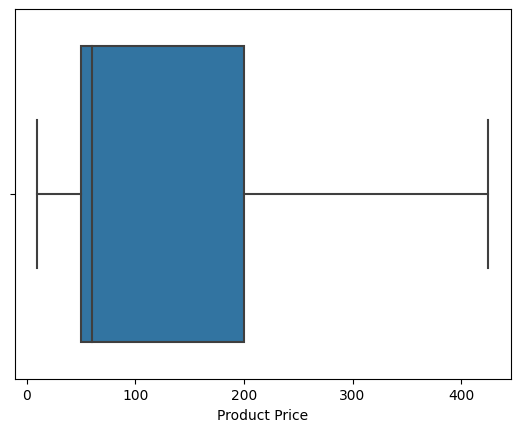

In [9]:
q1=df['Product Price'].quantile(.25)
q3=df['Product Price'].quantile(.75)
iqr=q3-q1
df['Product Price']=np.where(df['Product Price']>q3+1.5*iqr,q3+1.5*iqr,df['Product Price'])
sns.boxplot(x=df['Product Price'])
plt.show()

## Encoding (Regression)

In [18]:
df_enc=df.copy()
for i in ['Type','Category Name','Customer City','Customer State','Department Name','Order Country',
          'Order Region','Order Status']:
    df_enc[i]=df_enc[i].map(df_enc.groupby(i).Sales.mean())
df_enc['Delivery Status']=df_enc['Delivery Status'].map({'Advance shipping':0,'Shipping on time':1,
                                                         'Late delivery':2,'Shipping canceled':3})
df_enc['Shipping Mode']=df_enc['Shipping Mode'].map({'Same Day':0,'First Class':1,'Second Class':2,
                                                     'Standard Class':3})
for i in ['Order City','Order State','Product Name']:
    df_enc[i]=LabelEncoder().fit_transform(df_enc[i])
df_enc=pd.get_dummies(df_enc,columns=['Customer Country','Customer Segment','Market'],drop_first=True)
df_enc.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer State,Department Name,Latitude,Longitude,Order City,Order Country,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Sales,Order Region,Order State,Order Status,Product Name,Product Price,Shipping Mode,order year,order month,order day,order weekday,shipping year,shipping month,shipping day,shipping weekday,Customer Country_Puerto Rico,Customer Segment_Corporate,Customer Segment_Home Office,Market_Europe,Market_LATAM,Market_Pacific Asia,Market_USCA
0,203.143916,3,4,91.250000,314.640015,0,0,327.75,203.838044,203.973329,160.165749,18.251453,-66.037056,331,201.618917,13.110000,0.04,0.29,1,327.75,202.588905,475,203.313357,78,327.75,3,2018,1,31,2,2018,2,3,5,1,0,0,0,0,1,0
1,204.376280,5,4,-249.089996,311.359985,2,1,327.75,203.838044,203.973329,160.165749,18.279451,-66.037064,391,201.211938,16.389999,0.05,-0.80,1,327.75,200.967652,841,203.714484,78,327.75,3,2018,1,13,5,2018,1,18,3,1,0,0,0,0,1,0
2,205.068524,4,4,-247.779999,309.720001,1,0,327.75,208.360725,202.889300,160.165749,37.292233,-121.881279,391,201.211938,18.030001,0.06,-0.80,1,327.75,200.967652,841,205.068524,78,327.75,3,2018,1,13,5,2018,1,17,2,0,0,0,0,0,1,0
3,203.143916,3,4,22.860001,304.809998,0,0,327.75,204.239808,202.889300,160.165749,34.125946,-118.291016,3226,199.437645,22.940001,0.07,0.08,1,327.75,198.724300,835,203.313357,78,327.75,3,2018,1,13,5,2018,1,16,1,0,0,1,0,0,1,0
4,203.483552,2,4,134.210007,298.250000,0,0,327.75,203.838044,203.973329,160.165749,18.253769,-66.037048,3226,199.437645,29.500000,0.09,0.45,1,327.75,198.724300,835,203.522232,78,327.75,3,2018,1,13,5,2018,1,15,0,1,1,0,0,0,1,0


## Splitting the Data (Regression)

In [19]:
x=df_enc.drop(['Sales','Sales per customer'],axis=1)
y=df_enc.Sales
xrtrain,xrtest,yrtrain,yrtest=train_test_split(x,y,test_size=.2,random_state=100)
print(xrtrain.shape,xrtest.shape,yrtrain.shape,yrtest.shape)

(144415, 39) (36104, 39) (144415,) (36104,)


## Model Building (Regression)

In [20]:
o=OLS(yrtrain,add_constant(xrtrain)).fit()
o.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Sales   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                 4.978e+04
Date:                Sun, 14 May 2023   Prob (F-statistic):               0.00
Time:                        15:06:30   Log-Likelihood:            -7.1778e+05
No. Observations:              144415   AIC:                         1.436e+06
Df Residuals:                  144375   BIC:                         1.436e+06
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                         -9156.2522    230.759    -39.679      0.000   -9608.535   -8703.970
Type                             -0.0459      0.214     -0.215      0.830      -0.465       0.373
Days for shipping (real)          1.0912      0.365      2.988      0.003       0.375       1.807
Days for shipment (scheduled)     0.0321      0.409      0.079      0.937      -0.769       0.833
Benefit per order                 0.0258      0.002     16.492      0.000       0.023       0.029
Delivery Status                  -0.1820      0.212     -0.858      0.391      -0.598       0.234
Late_delivery_risk               -0.4203      0.338     -1.245      0.213      -1.082       0.241
Category Name                     0.6238      0.002    383.061      0.000       0.621       0.627
Customer City                     0.0620      0.013      4.857      0.000       0.037       0.087
Customer State                   -0.0692      0.049     -1.398      0.162      -0.166       0.028
Department Name                   0.0258      0.002     15.419      0.000       0.022       0.029
Latitude                         -0.0048      0.024     -0.203      0.839      -0.051       0.042
Longitude                         0.0006      0.006      0.092      0.927      -0.011       0.013
Order City                    -9.235e-05   9.49e-05     -0.973      0.331      -0.000    9.37e-05
Order Country                     0.1075      0.023      4.581      0.000       0.061       0.153
Order Item Discount               1.4760      0.009    164.471      0.000       1.458       1.494
Order Item Discount Rate       -300.1696      2.249   -133.454      0.000    -304.578    -295.761
Order Item Profit Ratio          -5.0687      0.349    -14.544      0.000      -5.752      -4.386
Order Item Quantity              39.2778      0.089    440.904      0.000      39.103      39.452
Order Region                      0.2497      0.036      6.975      0.000       0.180       0.320
Order State                       0.0007      0.000      2.128      0.033    5.21e-05       0.001
Order Status                      0.1488      0.150      0.993      0.321      -0.145       0.442
Product Name                      0.0201      0.005      3.935      0.000       0.010       0.030
Product Price                     0.4154      0.002    258.597      0.000       0.412       0.419
Shipping Mode                    -0.1773      0.653     -0.272      0.786      -1.457       1.102
order year                      344.5194    124.935      2.758      0.006      99.649     589.390
order month                      28.3696     10.395      2.729      0.006       7.997      48.743
order day                         1.0073      0.342      2.948      0.003       0.338       1.677
order weekday                     0.1636     

In [21]:
train_pred=o.predict(add_constant(xrtrain))
test_pred=o.predict(add_constant(xrtest))
print('R2 for train data =',r2_score(yrtrain,train_pred))
print('R2 for test data =',r2_score(yrtest,test_pred))

R2 for train data = 0.9307842374834029
R2 for test data = 0.9268591336625313


In [22]:
print('RMSE for train data =',rmse(yrtrain,train_pred))
print('RMSE for test data =',rmse(yrtest,test_pred))

RMSE for train data = 34.86025170075884
RMSE for test data = 35.52159178653053


## Encoding (Classification)

In [23]:
df_enc=df.copy()
for i in ['Category Name','Customer State','Department Name','Order Region','Type','Customer Country',
          'Customer Segment','Market','Delivery Status']:
    df_enc[i]=df_enc[i].map(df_enc.groupby(i).Late_delivery_risk.mean())
df_enc['Shipping Mode']=df_enc['Shipping Mode'].map({'Same Day':0,'First Class':1,'Second Class':2,
                                                     'Standard Class':3})
for i in ['Order City','Order State','Product Name','Customer City','Order Country']:
    df_enc[i]=LabelEncoder().fit_transform(df_enc[i])
df_enc['Order Status']=df_enc['Order Status'].map(df_enc['Order Status'].value_counts(True))
df_enc.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Department Name,Latitude,Longitude,Market,Order City,Order Country,Order Item Discount,Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Sales,Order Region,Order State,Order Status,Product Name,Product Price,Shipping Mode,order year,order month,order day,order weekday,shipping year,shipping month,shipping day,shipping weekday
0,0.572177,3,4,91.250000,314.640015,0.0,0,0.554622,66,0.547634,0.548084,0.547634,0.555466,18.251453,-66.037056,0.55046,331,70,13.110000,0.04,0.29,1,327.75,0.555299,475,0.329555,78,327.75,3,2018,1,31,2,2018,2,3,5
1,0.485436,5,4,-249.089996,311.359985,1.0,1,0.554622,66,0.547634,0.548084,0.547634,0.555466,18.279451,-66.037064,0.55046,391,69,16.389999,0.05,-0.80,1,327.75,0.562670,841,0.112049,78,327.75,3,2018,1,13,5,2018,1,18,3
2,0.566323,4,4,-247.779999,309.720001,0.0,0,0.554622,452,0.548702,0.548084,0.553673,0.555466,37.292233,-121.881279,0.55046,391,69,18.030001,0.06,-0.80,1,327.75,0.562670,841,0.108664,78,327.75,3,2018,1,13,5,2018,1,17,2
3,0.572177,3,4,22.860001,304.809998,0.0,0,0.554622,285,0.548702,0.550704,0.553673,0.555466,34.125946,-118.291016,0.55046,3226,8,22.940001,0.07,0.08,1,327.75,0.540205,835,0.329555,78,327.75,3,2018,1,13,5,2018,1,16,1
4,0.575291,2,4,134.210007,298.250000,0.0,0,0.554622,66,0.547634,0.547227,0.547634,0.555466,18.253769,-66.037048,0.55046,3226,8,29.500000,0.09,0.45,1,327.75,0.540205,835,0.220653,78,327.75,3,2018,1,13,5,2018,1,15,0


## Splitting the Data (Classification)

In [24]:
x=df_enc.drop(['Late_delivery_risk','Delivery Status'],axis=1)
y=df_enc.Late_delivery_risk
xctrain,xctest,yctrain,yctest=train_test_split(x,y,test_size=.2,random_state=100)
print(xctrain.shape,xctest.shape,yctrain.shape,yctest.shape)

(144415, 35) (36104, 35) (144415,) (36104,)


## Model Building (Classification)

In [25]:
lr=LogisticRegression().fit(xctrain,yctrain)
pred=lr.predict(xctrain)
print('Report for train data :\n\n',classification_report(yctrain,pred))

Report for train data :

               precision    recall  f1-score   support

           0       0.94      0.91      0.92     65330
           1       0.93      0.95      0.94     79085

    accuracy                           0.93    144415
   macro avg       0.93      0.93      0.93    144415
weighted avg       0.93      0.93      0.93    144415



In [26]:
pred=lr.predict(xctest)
print('Report for test data :\n\n',classification_report(yctest,pred))

Report for test data :

               precision    recall  f1-score   support

           0       0.94      0.91      0.92     16212
           1       0.93      0.95      0.94     19892

    accuracy                           0.93     36104
   macro avg       0.93      0.93      0.93     36104
weighted avg       0.93      0.93      0.93     36104



## Model Explanation (Classification)

In [47]:
xctrain_val=xctrain.values
e=lime_tabular.LimeTabularExplainer(xctrain_val,feature_names=xctrain.columns,
                                    class_names=['No','Yes'],discretize_continuous=True)

In [48]:
i=np.random.randint(0,xctrain.shape[0])
i

83280

In [49]:
e=e.explain_instance(xctrain_val[i],lr.predict_proba,top_labels=1,num_features=35)

In [51]:
e.show_in_notebook(show_table=True,show_all=True)